# SIRIS Academic - Practical assignment for Junior Data Scientist


We will be looking at the publications originating in Grenoble from the [HAL open archive](https://hal.archives-ouvertes.fr/) for the last 10 years, and will analyse the local research output in terms of specialisation and collaboration between institutions. We will also attempt to tackle a couple of NLP tasks.

---

This notebook can be downloaded from [here](https://cparrarojas.github.io/files/SIRIS.ipynb)

## Imports

In [106]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd

import requests as req

import seaborn as sns
sns.set_palette('colorblind')

import networkx as nx

from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

In [2]:
import matplotlib.pyplot as plt
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams['font.family'] = 'serif'
plt.rcParams['text.usetex'] = True
plt.rcParams['font.size'] = 26

In [ ]:
import spacy
from spacy.lang.en.stop_words import STOP_WORDS
!python -m spacy download en_core_web_lg

In [252]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

## Parts 0 & 1

In [3]:
# The main url for requests

URL = 'https://api.archives-ouvertes.fr/search/'

We will perform a series of requests to the database API, and in the cell below we define parameters for each of them.

The main request will return the documents themselves, to be subsequently used in **Part 4**&mdash;the important field will be the English abstract, but I've added others for exploration. At the same time, using the `facet.pivot` option, it will return the count of documents arranged by date to the month level&mdash;could be by day but this would probably only obscure the results&mdash;and, within each month, by institution.

When filtering the documents, some assumptions have been made. I have considered as "publications" all documents corresponding to journal articles (`docType_s=ART`), conference papers (`docType_s=COMM`) and book sections (`docType_s=COUV`). In principle, I would think about also including books themselves, but in general I consider that a book section resembles the rest of the types of publication more than an entire book. In any case, there were no results when looking at books only (`docType_s=OUV`), in combination with the city and date filters.

Setting the `city_t` field to `grenoble` is a bit tricky because we will miss publications from institutions located in Grenoble that are produced in a different city$^1$. The same is true for the inverse scenario, when a publication from Grenoble contains [only outsider institutions](https://hal.archives-ouvertes.fr/hal-01250397). This is because the great majority of the results correspond to conference papers, and the assigned city is the one where the conference was held. Perhaps a better way to look at this is to filter by institution instead of "city of production"&mdash;I tried exploring the `structAddress_s` field but ended up dropping the idea, in part because of the lack of a one-to-one correspondence (in length) between the lists of intitution names and addresses. However this still poses a problem in terms of discerning between Grenoble and France as a whole, due to the extensive network of collaborations. I went with `city_t`, but it is important to keep these caveats in mind.

**Note:** Using `ePublicationDate` instead of `submittedDate` does not yield any results when `city_t=grenoble`.

The secondary requests, to be used in **Part 2**, correspond to the number of publications per field&mdash;I will focus on primary fields and ignore subfields&mdash;within Grenoble and in the full database. Since we only need counts, we use the `facet` option to count the documents per field but retrieve none of the documents themselves (`rows=0`).

We use the full database for this, but note that there is a `country_t` field that can be used to filter the query. A quick exploration$^2$ shows that the number of documents in the database corresponding to French institutions is much larger than the number of documents "from France". This brings us back to the issues with the `city_t` field described above, and reminds us that we are ignoring publications from institutions in Grenoble that collaborate in a publication listed as "produced" in a different city.

---
$^1$ See, *e.g.*, the `numFound` field for the Université Grenoble Alpes [when `city_t=grenoble`](https://api.archives-ouvertes.fr/search/?q=structName_s:%22Universit%C3%A9%20Grenoble%20Alpes%22&wt=xml&rows=0&fq=city_t:grenoble) *versus* [in total](https://api.archives-ouvertes.fr/search/?q=structName_s:%22Universit%C3%A9%20Grenoble%20Alpes%22&wt=xml&rows=0).

$^2$ See the `numFound` field for [`structCountry_s=fr`](https://api.archives-ouvertes.fr/search/?q=structCountry_s:fr&wt=xml&rows=0) *versus* [`country_t=fr`](https://api.archives-ouvertes.fr/search/?q=country_t:fr&wt=xml&rows=0).

In [4]:
main_params = {
               'q': 'city_t:grenoble',
               'fq': ['docType_s:(ART OR COMM OR COUV)','submittedDateY_i:[2009 TO 2018]'],
               'fl': 'docid,structName_s,submittedDateY_i,level0_domain_s,en_abstract_s,uri_s',
               'rows': '10000',
               'facet': 'true',
               'facet.pivot': 'submittedDateY_i,submittedDateM_i,structName_s',
               'facet.limit': '10000'
              }

gr_fields_params = {
                    'q': 'city_t:grenoble',
                    'fq': ['docType_s:(ART OR COMM OR COUV)','submittedDateY_i:[2009 TO 2018]'],
                    'rows': '0',
                    'facet': 'true',
                    'facet.field': 'level0_domain_s',
                    'facet.limit': '13',
                   }

fr_fields_params = {
                    'q': '*:*',
                    'fq': ['docType_s:(ART OR COMM OR COUV)','submittedDateY_i:[2009 TO 2018]'],
                    'rows': '0',
                    'facet': 'true',
                    'facet.field': 'level0_domain_s',
                    'facet.limit': '13',
                   }

In [5]:
# Perform the main request

main_request = req.get(URL, params=main_params)

In [6]:
# Making sure the request above makes sense

print(main_request.url)

https://api.archives-ouvertes.fr/search/?q=city_t%3Agrenoble&fq=docType_s%3A%28ART+OR+COMM+OR+COUV%29&fq=submittedDateY_i%3A%5B2009+TO+2018%5D&fl=docid%2CstructName_s%2CsubmittedDateY_i%2Clevel0_domain_s%2Cen_abstract_s%2Curi_s&rows=10000&facet=true&facet.pivot=submittedDateY_i%2CsubmittedDateM_i%2CstructName_s&facet.limit=10000


From the response I will create several Pandas dataframes for later use. The cell below is used to take a look at its general structure of keys.

In [7]:
# main_request.json()

In [8]:
# Obtaining the document data

df_docs = pd.DataFrame.from_dict(main_request.json()['response']['docs'])

df_docs.head()

,docid,en_abstract_s,level0_domain_s,structName_s,submittedDateY_i,uri_s
0,450118,NaN,[spi],"[Centre de Recherche en Automatique de Nancy, ...",2010,https://hal.archives-ouvertes.fr/hal-00450118
1,1700052,NaN,"[info, info, spi, spi]",[Equipes Traitement de l'Information et Systèm...,2018,https://hal.archives-ouvertes.fr/hal-01700052
2,750207,NaN,[shs],"[Centre Max Weber, Centre National de la Reche...",2012,https://halshs.archives-ouvertes.fr/halshs-007...
3,750224,NaN,[shs],"[Centre Max Weber, Centre National de la Reche...",2012,https://halshs.archives-ouvertes.fr/halshs-007...
4,1400106,NaN,[spi],[Techniques of Informatics and Microelectronic...,2016,https://hal.archives-ouvertes.fr/hal-01400106


Below, I extract information from the pivot to construct a dataframe of institutions, showing the number of publications per month and year that they were part of.

In [9]:
pivot = main_request.json()['facet_counts']['facet_pivot']['submittedDateY_i,submittedDateM_i,structName_s']

In [10]:
df_inst = pd.concat([pd.DataFrame([[z['value'], x['value'], y['value'], z['count']] for y in x['pivot'] for z in y['pivot']], columns=['institution', 'year', 'month', 'count']).sort_values(by=['year', 'month']).reset_index(drop=True) for x in pivot], ignore_index=True)

df_inst.head(10)

,institution,year,month,count
0,Centre National de la Recherche Scientifique,2018,1,32
1,Université Grenoble Alpes,2018,1,13
2,Université Joseph Fourier - Grenoble 1,2018,1,8
3,Université Pierre Mendès France - Grenoble 2,2018,1,8
4,Institut Polytechnique de Grenoble - Grenoble ...,2018,1,7
5,Université de Montpellier,2018,1,7
6,Institut polytechnique de Grenoble - Grenoble ...,2018,1,4
7,Université Paris-Seine,2018,1,4
8,Université Paris-Sud - Paris 11,2018,1,4
9,Université de Cergy Pontoise,2018,1,4


Since each publication can involve several institutions, we cannot simply add the count of publications for all institutions in order to find the total per month. However, the first levels of the pivot contains precisely this information.

The table below shows the time evolution of the total number of publications "produced" in Grenoble between 2009 and 2018.

In [11]:
df_all_actors = pd.concat([pd.DataFrame([[x['value'], y['value'], y['count']] for y in x['pivot']], 
                                        columns=['year', 'month', 'count']) for x in pivot], 
                           ignore_index=True).sort_values(by=['year', 'month']).reset_index(drop=True)

df_all_actors.head(5)

,year,month,count
0,2009,1,26
1,2009,2,50
2,2009,3,39
3,2009,4,63
4,2009,5,60


In [12]:
df_all_actors['day'] = 1 # We don't acre about the day, but this is needed for the call below.
df_all_actors['date'] = pd.to_datetime(df_all_actors[['year','month','day']])

df_all_actors.head()

,year,month,count,day,date
0,2009,1,26,1,2009-01-01
1,2009,2,50,1,2009-02-01
2,2009,3,39,1,2009-03-01
3,2009,4,63,1,2009-04-01
4,2009,5,60,1,2009-05-01


We plot these data below:

Text(0.5, 1.0, 'Publications from all institutions between 2009 and 2018')

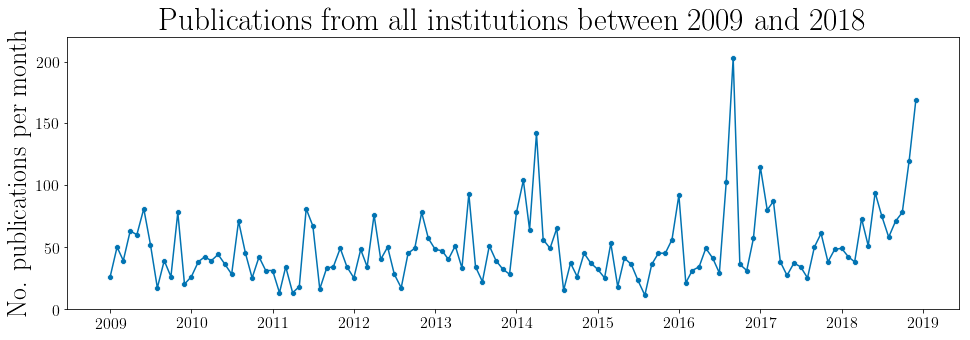

In [13]:
_,_ = plt.subplots(figsize=(16,5))
sns.lineplot(data=df_all_actors, x='date', y='count')
sns.scatterplot(data=df_all_actors, x='date', y='count')
plt.ylim(0, 220)
plt.xlabel('')
plt.ylabel('No. publications per month')
plt.title('Publications from all institutions between 2009 and 2018')

Looking at the month-resolved data, we see that the number of publications is relatively stable through most the relevant period. The ups and downs seem not to follow a specific pattern in terms of *e.g.* "good" or "bad" months. A few things to note are:
- 2014 was a particularly productive year.
- 2015 a particularly unproductive year.
- There was a large surge in mid 2016.
- The number of publications shows what it seems to be a steadily increasing pattern&mdash;as opposed to a quick surge&mdash;since mid 2017.

**Note:** All these observations relate to the *use* of the database, and very likely do not reflect the actual number of publications, so that the "productivity" should be taken in context.

A closer look at the data between 2016 and 2018 shows that the "good" month in 2016 corresponds to September, and that the increasing trend in publications uploaded to the database dates back to April/May 2017.

Text(0.5, 1.0, 'Publications from all institutions between 2016 and 2018')

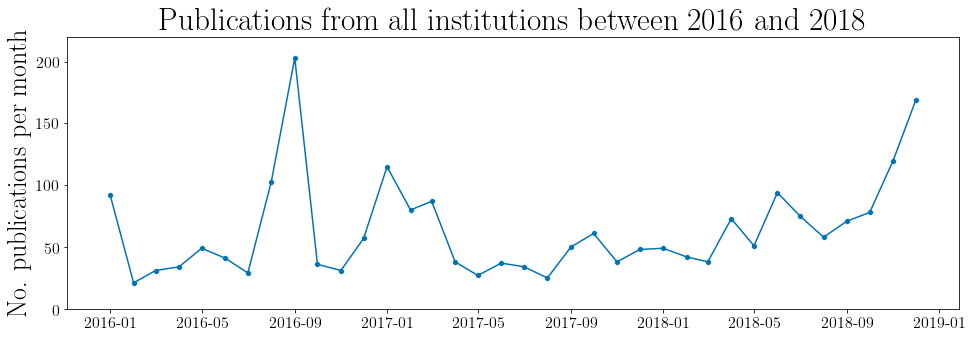

In [14]:
_, _ = plt.subplots(figsize=(16,5))
sns.lineplot(data=df_all_actors[df_all_actors.date >= pd.datetime(2016,1,1)], x='date', y='count')
sns.scatterplot(data=df_all_actors[df_all_actors.date >= pd.datetime(2016,1,1)], x='date', y='count')
plt.ylim(0, 220)
plt.xlabel('')
plt.ylabel('No. publications per month')
plt.title('Publications from all institutions between 2016 and 2018')

One thing we can ask is: which were the most "productive" institutions in September 2016? The top actors are shown below.

In [39]:
df_inst[(df_inst.year == 2016) & (df_inst.month == 9)].groupby('institution')['count'].sum().sort_values(ascending=False).head(10)

institution
Centre National de la Recherche Scientifique                                                      133
Université Grenoble Alpes                                                                          51
Université Joseph Fourier - Grenoble 1                                                             46
Institut Polytechnique de Grenoble                                                                 43
Institut National des Sciences Appliquées                                                          37
Laboratoire de Génie Electrique de Grenoble                                                        36
Université Paris-Sud - Paris 11                                                                    36
Université de Lyon                                                                                 25
Institut National des Sciences Appliquées de Lyon                                                  23
Institut Français des Sciences et Technologies des Transports, de l'Am

At a coarser level, the yearly data shows that the number of publications almost doubled since 2009, with 2015 being a rather "slow" year, as mentioned above.

Text(0.5, 1.0, 'Publications from all institutions between 2009 and 2018')

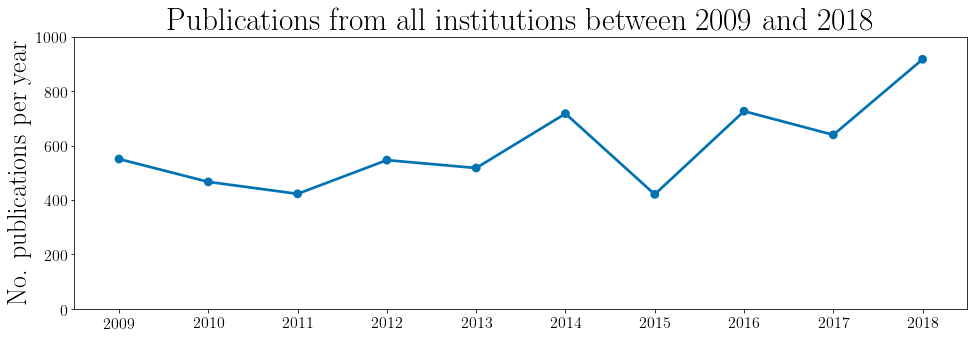

In [15]:
_,_ = plt.subplots(figsize=(16,5))
sns.pointplot(data=df_all_actors.groupby('year')['count'].sum().reset_index(), x='year', y='count')
plt.ylim(0, 1000)
plt.xlabel('')
plt.ylabel('No. publications per year')
plt.title('Publications from all institutions between 2009 and 2018')

We can now take a look at the top institutions, in terms of publication count, from the data for the whole period.

In [16]:
df_inst.groupby('institution')['count'].sum().sort_values(ascending=False).head(10)

institution
Centre National de la Recherche Scientifique                             4190
Université Grenoble Alpes                                                1814
Université Joseph Fourier - Grenoble 1                                   1411
Université Pierre Mendès France - Grenoble 2                             1018
Institut polytechnique de Grenoble - Grenoble Institute of Technology     617
Institut National Polytechnique de Grenoble                               572
Institut Polytechnique de Grenoble - Grenoble Institute of Technology     474
Institut National de Recherche en Informatique et en Automatique          470
Université de Lyon                                                        465
Institut National des Sciences Appliquées                                 432
Name: count, dtype: int64

The first thing we observe is that we have two separate entries for the Institut Polytechnique de Grenoble, plus another one with a very similar name. A [quick search](https://fr.wikipedia.org/wiki/Institut_polytechnique_de_Grenoble) reveals that all three entries correspond to the same institution.

I think it is reasonable to expect similar problems with other institutions as well. Not only repeated entries, but also a unit/department/lab of an institution listed as a separate entity. I will not perform other joining operations further down the list of institutions, but I think it is important to keep this in mind.

In the following cells, the count for the Institut Polytechnique de Grenoble is corrected.

In [17]:
# Making a request with the institution matching any of the three names

git_names =[
            'Institut polytechnique de Grenoble - Grenoble Institute of Technology',
            'Institut National Polytechnique de Grenoble',
            'Institut Polytechnique de Grenoble - Grenoble Institute of Technology'
           ]

git_params = {
       'q': 'city_t:grenoble',
       'fq': ['docType_s:(ART OR COMM OR COUV)','submittedDateY_i:[2009 TO 2018]',
              'structName_s:("' + git_names[0] + '" OR "' + git_names[1] + '" OR "' + git_names[2] + '")'],
       'rows': '0',
       'facet': 'true',
       'facet.pivot': 'submittedDateY_i,submittedDateM_i',
       'facet.limit': '12'
      }

git = req.get(URL, params=git_params)

In [18]:
# Extracting the corresponding dataframe

pivot = git.json()['facet_counts']['facet_pivot']['submittedDateY_i,submittedDateM_i']

df_git = pd.concat([pd.DataFrame([['Institut Polytechnique de Grenoble', 
                                   x['value'], y['value'], y['count']] for y in x['pivot']], 
                                  columns=['institution', 'year', 'month', 'count']) for x in pivot], 
                   ignore_index=True).sort_values(by=['year', 'month']).reset_index(drop=True)

df_git.head()

,institution,year,month,count
0,Institut Polytechnique de Grenoble,2009,1,12
1,Institut Polytechnique de Grenoble,2009,2,9
2,Institut Polytechnique de Grenoble,2009,3,18
3,Institut Polytechnique de Grenoble,2009,4,14
4,Institut Polytechnique de Grenoble,2009,5,8


In [19]:
# Replacing the three entries in the original dataframe with the single correct entry

df_inst = pd.concat([df_inst[~df_inst['institution'].isin(git_names)], df_git], ignore_index=True)

In [20]:
# Looking again at the top actors with the duplicates removed

sorted_inst = df_inst.groupby('institution')['count'].sum().sort_values(ascending=False).head(10)

sorted_inst

institution
Centre National de la Recherche Scientifique                        4190
Université Grenoble Alpes                                           1814
Université Joseph Fourier - Grenoble 1                              1411
Institut Polytechnique de Grenoble                                  1052
Université Pierre Mendès France - Grenoble 2                        1018
Institut National de Recherche en Informatique et en Automatique     470
Université de Lyon                                                   465
Institut National des Sciences Appliquées                            432
Université Savoie Mont Blanc                                         332
Sciences Po Grenoble - Institut d'études politiques de Grenoble      316
Name: count, dtype: int64

Now, we see that the institution at the very top corresponds to the CNRS, which has centres in several locations, including Grenoble. Without further location information, I will assume this counts as "from Grenoble". The following four institution on the list are from the city.

Below, the contributions per year are plotted for the top five institutions. Since the total number of publications has been generally increasing since 2009, I have chosen to plot the fraction of the yearly total, rather than the raw number. Note that the fractions do not add up to 1, due to collaborations, so *e.g.* a stacked bar plot does not make sense in this case.

Text(0.5, 1.0, 'Publications from the top five institutions between 2009 and 2018')

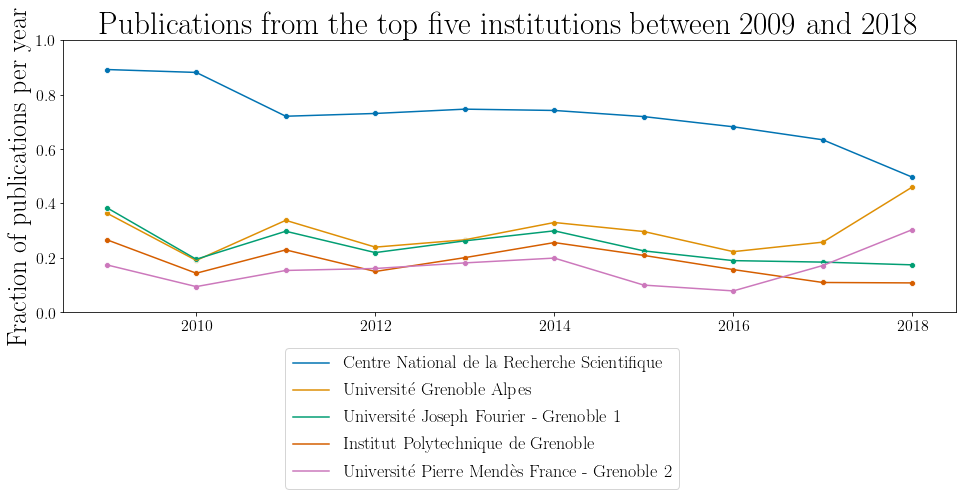

In [21]:
_, _ = plt.subplots(figsize=(16,5))

for institution in sorted_inst.index[:5]:
    aux_df = df_inst[df_inst.institution == institution].copy().groupby('year')['count'].sum().reset_index()
    
    aux_df['fraction'] = aux_df['count'].values/df_all_actors.groupby('year')['count'].sum().reset_index()['count'].values
    
    sns.lineplot(data=aux_df, x='year', y='fraction', label=institution)
    sns.scatterplot(data=aux_df, x='year', y='fraction')
    plt.ylim(0,1)
    
plt.legend(bbox_to_anchor=(0.7, -0.1), fontsize=18)
plt.xlabel('')
plt.ylabel('Fraction of publications per year')
plt.title('Publications from the top five institutions between 2009 and 2018')

From the plot above, we observe a clear dominant actor: the CNRS. Again, this may come from the fact that we are considering all contributions from the CNRS as "local", when this is most likely not the case. In light of this, it is more interesting perhaps to note that the fraction of publications of which the CNRS is a contributor has been steadily decreasing in the last 5 years or so.

While the level of contribution of the other four institutions remains more or less stable through most of the observed period, we see that Université Grenoble Alpes and the Université Pierre Mendès France - Grenoble 2 show an increasing participation in the last 2 to 3 years.

## Part 2

Here, we get the publication count per primary field for Grenoble and for the full database. This will provided us with information on the specialisation level within Grenoble with respect to France as a whole&mdash;always keeping in mind the discussion above on the `city_t` and `country_t` fields in the database.

In [22]:
# The requests

grenoble_fields = req.get(URL, params=gr_fields_params)
france_fields = req.get(URL, params=fr_fields_params)

In [23]:
# Constructing a dataframe

grenoble_fields_counts = grenoble_fields.json()['facet_counts']['facet_fields']['level0_domain_s']
france_fields_counts = france_fields.json()['facet_counts']['facet_fields']['level0_domain_s']

df_grenoble_fields = pd.DataFrame({'region': 'Grenoble',
                                   'field': grenoble_fields_counts[::2],
                                   'count': grenoble_fields_counts[1::2],
                                   'fraction': np.array(grenoble_fields_counts[1::2])/grenoble_fields.json()['response']['numFound']}).sort_values(by='field').reset_index(drop=True)

df_france_fields = pd.DataFrame({'region': 'France',
                                 'field': france_fields_counts[::2],
                                 'count': france_fields_counts[1::2],
                                 'fraction': np.array(france_fields_counts[1::2])/france_fields.json()['response']['numFound']}).sort_values(by='field').reset_index(drop=True)

df_fields = pd.concat([df_grenoble_fields, df_france_fields], ignore_index=True)

df_fields.head()

,region,field,count,fraction
0,Grenoble,chim,146,0.024621
1,Grenoble,info,1176,0.198314
2,Grenoble,math,122,0.020573
3,Grenoble,nlin,2,0.000337
4,Grenoble,phys,619,0.104384


Here, we make an additional request to map the field codes to their names.

In [24]:
field_names = req.get('https://api.archives-ouvertes.fr/ref/domain/?fq=level_i:0')

In [25]:
codes_names = [x['label_s'] for x in field_names.json()['response']['docs']]
codes_names = [x.split(' = ') for x in codes_names]

field_names_map = {x[0]: x[1][:x[1].find(' [')] if x[1].find(' [')>0 else x[1] for x in codes_names}

field_names_map

{'chim': 'Chimie',
 'info': 'Informatique',
 'math': 'Mathématiques',
 'nlin': 'Science non linéaire',
 'phys': 'Physique',
 'qfin': 'Économie et finance quantitative',
 'scco': 'Sciences cognitives',
 'sde': "Sciences de l'environnement",
 'sdu': 'Planète et Univers',
 'sdv': 'Sciences du Vivant',
 'shs': "Sciences de l'Homme et Société",
 'spi': "Sciences de l'ingénieur",
 'stat': 'Statistiques'}

In [26]:
df_fields['field'] = df_fields['field'].apply(lambda x: field_names_map[x])

df_fields.head()

,region,field,count,fraction
0,Grenoble,Chimie,146,0.024621
1,Grenoble,Informatique,1176,0.198314
2,Grenoble,Mathématiques,122,0.020573
3,Grenoble,Science non linéaire,2,0.000337
4,Grenoble,Physique,619,0.104384


Below, we plot the fraction of publications per field in Grenoble *versus* France. This immediately gives us an idea of which fields the city is a specialist in. These correspond to: Informatique (Computer Science), Sciences cognitives (Cognitive science), Sciences de l'environnement (Environmental Sciences), Sciences de l'Homme et Société (Humanities and Social Sciences), and Sciences de l'ingénieur (Engineering Sciences)$^1$.

---

$^1$ English names from the [search by domain](https://hal.archives-ouvertes.fr/browse/domain)

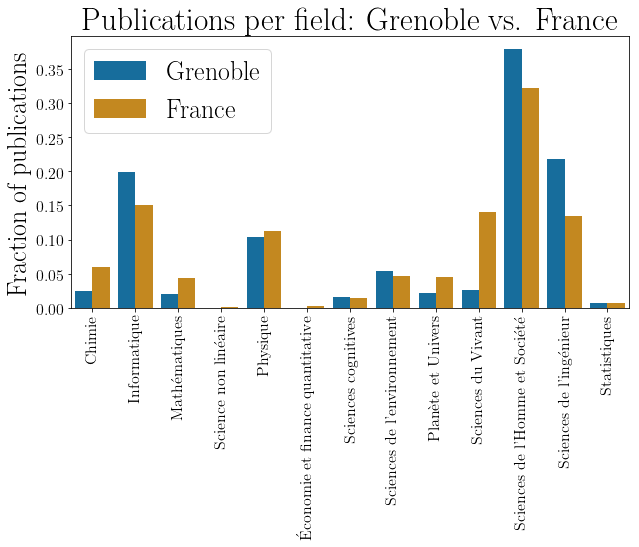

In [27]:
_, _ = plt.subplots(figsize=(10,5))
plot = sns.barplot(data=df_fields, x='field', y='fraction', hue='region')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)
plt.xlabel('')
plt.ylabel('Fraction of publications')
plt.title('Publications per field: Grenoble vs. France')
plt.legend()

In order to quantify the specialisation, we compute the Specialisation Index (SI) defined, in this case, as

$$SI_{\text{field}} \equiv \frac{\left(\frac{\text{publications}_{\text{field}}}{\text{publications}_{\text{all}}}\right)_{\text{Grenoble}}}{\left(\frac{\text{publications}_{\text{field}}}{\text{publications}_{\text{all}}}\right)_{\text{France}}}$$

In [28]:
# Computing the SI

df_grenoble_fields['SI'] = df_grenoble_fields['fraction']/df_france_fields['fraction']

df_grenoble_fields = df_grenoble_fields.sort_values(by='SI', ascending=False).reset_index(drop=True)


# Full name for fields

df_grenoble_fields['field'] = df_grenoble_fields['field'].apply(lambda x: field_names_map[x])

df_grenoble_fields

,region,field,count,fraction,SI
0,Grenoble,Sciences de l'ingénieur,1295,0.218381,1.621960
1,Grenoble,Informatique,1176,0.198314,1.321590
2,Grenoble,Sciences de l'Homme et Société,2246,0.378752,1.175070
3,Grenoble,Sciences de l'environnement,322,0.054300,1.161131
4,Grenoble,Sciences cognitives,99,0.016695,1.130678
5,Grenoble,Statistiques,44,0.007420,0.940193
6,Grenoble,Physique,619,0.104384,0.932333
7,Grenoble,Planète et Univers,131,0.022091,0.488339
8,Grenoble,Mathématiques,122,0.020573,0.472762
9,Grenoble,Chimie,146,0.024621,0.406924


Below, we plot the SI per field, finding that the top field in the city is Engineering Sciences. Furthermore we note that, while their SI is lower than 1, Statistics and Physics are still at level with the country as a whole. The rest of the fields are comparatively at a clear disadvantage.

Text(0.5, 1.0, 'Grenoble Specialisation Index')

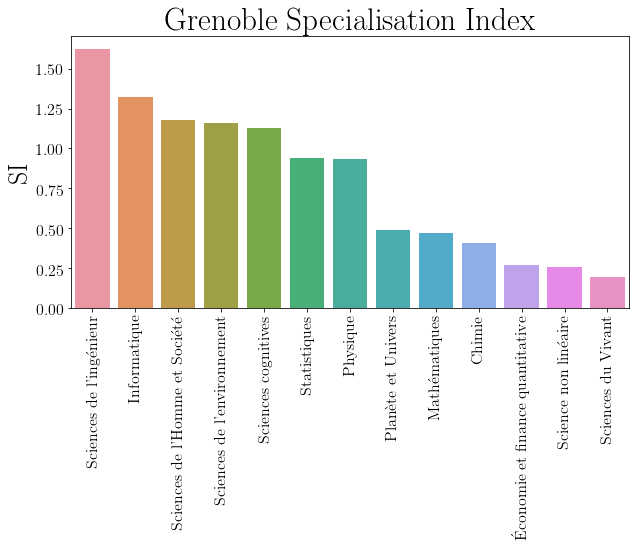

In [29]:
_, _ = plt.subplots(figsize=(10,5))

plot = sns.barplot(data=df_grenoble_fields, x='field', y='SI')
plot.set_xticklabels(plot.get_xticklabels(), rotation=90)

plt.xlabel('')
plt.title('Grenoble Specialisation Index')

In order to find the top institutions in Engineering Sciences, we make another request faceting the publications from Grenoble in the field by institution. Note that we need to fix the publication count for the Institut Polytechnique de Grenoble once again.

In [30]:
# Request parameters

spi_params = {
               'q': 'city_t:grenoble',
               'fq': ['level0_domain_s:spi','docType_s:(ART OR COMM OR COUV)','submittedDateY_i:[2009 TO 2018]'],
               'rows': '0',
               'facet': 'true',
               'facet.field': 'structName_s',
               'facet.limit': '10'
              }

spi_git_params = {
       'q': 'city_t:grenoble',
       'fq': ['level0_domain_s:spi','docType_s:(ART OR COMM OR COUV)','submittedDateY_i:[2009 TO 2018]',
              'structName_s:("' + git_names[0] + '" OR "' + git_names[1] + '" OR "' + git_names[2] + '")'],
       'rows': '0'
      }

In [31]:
# The requests

spi = req.get(URL, params=spi_params)
spi_git = req.get(URL, params=spi_git_params)

spi_git_count = spi_git.json()['response']['numFound']

In [32]:
# Dataframe of publications in Engineering Sciences

spi_counts = spi.json()['facet_counts']['facet_fields']['structName_s']

df_spi = pd.DataFrame({'institution': spi_counts[::2], 'count': spi_counts[1::2]})


# Replacing the entry for the Institut Polytechnique de Grenoble with the correct count

df_spi = pd.concat([df_spi[~df_spi['institution'].isin(git_names)],
                    pd.DataFrame({'institution': ['Institut Polytechnique de Grenoble'], 'count': [spi_git_count]})],
                    ignore_index=True).sort_values(by='count', ascending=False).reset_index(drop=True)

df_spi

,institution,count
0,Centre National de la Recherche Scientifique,1082
1,Université Grenoble Alpes,449
2,Institut Polytechnique de Grenoble,449
3,Université Joseph Fourier - Grenoble 1,443
4,Institut National des Sciences Appliquées,164
5,Laboratoire de Génie Electrique de Grenoble,108
6,Université Savoie Mont Blanc,106
7,Université Pierre Mendès France - Grenoble 2,102


The top five institutions change slightly when going from counting all publications to counting only those in Engineering Sciences. From the city, these are:

1. CNRS
2. Université Grenoble Alpes
3. Institut Polytechnique de Grenoble
4. Université Joseph Fourier - Grenoble 1
5. Laboratoire de Génie Electrique de Grenoble

Again, this supposes that the CNRS is "from Grenoble". Also, I decided consider the Laboratoire de Génie Electrique de Grenoble separately instead of as a subunit, since it is attached to two different institutions at the same time: [the Institut Polytechnique de Grenoble and the Université Grenoble Alpes](http://www.g2elab.grenoble-inp.fr/fr/formation).

## Part 3

Now we are interested in the collaboration network between institutions. We start by getting the names of all institutions in our data for publications from Grenoble.

In [33]:
institutions = df_inst.institution.unique()

Then we create a dataframe of collaborations where each column represents an institution and each row a document. Looking at the dataframe of documents obtained initially, `df_docs`, we set the institution value to 1 for a given document if the institution appears in the list of institutions under `structName_s`, and zero otherwise.

In [34]:
colabs = {institution: np.zeros(df_docs.shape[0]).astype(int) for institution in institutions}

for i, row in df_docs[~df_docs.structName_s.isna()].iterrows():
    for institution in row.structName_s:
        if institution in git_names:
            colabs['Institut Polytechnique de Grenoble'][i] = 1
        else:
            colabs[institution][i] = 1

colabs = pd.DataFrame(colabs)

colabs.head()

,Centre National de la Recherche Scientifique,Université Grenoble Alpes,Université Joseph Fourier - Grenoble 1,Université Pierre Mendès France - Grenoble 2,Université de Montpellier,Université Paris-Seine,Université Paris-Sud - Paris 11,Université de Cergy Pontoise,École des Ponts ParisTech,AgroParisTech,...,"Security, Cryptology and Transmissions",Service Expérimentation et Développement [Bordeaux],Spanish National Research Council,Unité Propre Paysage,University of Adelaide,University of Tromsø,Université du Québec A Rimouski,Web Scale Trustworthy Collaborative Service Systems,Équipe Monde Byzantin,Institut Polytechnique de Grenoble
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,1,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


For each pair of institutions, we count the number of times a collaboration occurs.

The cell below takes a long time to run&mdash;I am sure there is a more intelligent way to compute this. In order to speed things up, I have saved the collaboration matrix as of Wednesday, 17 July 2019. It can be downloaded from [here](https://cparrarojas.github.io/files/colab_matrix_20190717.csv).

In [40]:
# colab_matrix = pd.DataFrame(index=institutions, columns=institutions)

# for i in range(institutions.shape[0]):
#     for j in range(i, institutions.shape[0]):
#         colab_matrix[institutions[i]][institutions[j]] = (colabs[institutions[i]]*colabs[institutions[j]]).sum()
#         colab_matrix[institutions[j]][institutions[i]] = (colabs[institutions[i]]*colabs[institutions[j]]).sum()
        
# colab_matrix.head(10)

In [36]:
# colab_matrix.to_csv('colab_matrix_20190717.csv')

In [37]:
colab_matrix = pd.read_csv('colab_matrix_20190717.csv', index_col=0)

colab_matrix.head(10)

,Centre National de la Recherche Scientifique,Université Grenoble Alpes,Université Joseph Fourier - Grenoble 1,Université Pierre Mendès France - Grenoble 2,Université de Montpellier,Université Paris-Seine,Université Paris-Sud - Paris 11,Université de Cergy Pontoise,École des Ponts ParisTech,AgroParisTech,...,"Security, Cryptology and Transmissions",Service Expérimentation et Développement [Bordeaux],Spanish National Research Council,Unité Propre Paysage,University of Adelaide,University of Tromsø,Université du Québec A Rimouski,Web Scale Trustworthy Collaborative Service Systems,Équipe Monde Byzantin,Institut Polytechnique de Grenoble
Centre National de la Recherche Scientifique,4190,1502,1392,767,136,53,203,57,42,31,...,0,1,1,0,1,1,1,1,1,1028
Université Grenoble Alpes,1502,1814,1345,963,14,8,23,8,3,2,...,0,0,0,0,0,0,1,0,0,955
Université Joseph Fourier - Grenoble 1,1392,1345,1411,684,13,8,23,8,4,0,...,0,0,0,0,0,0,1,0,0,966
Université Pierre Mendès France - Grenoble 2,767,963,684,1018,4,0,4,0,2,0,...,0,0,0,0,0,0,1,0,0,377
Université de Montpellier,136,14,13,4,158,1,1,1,0,1,...,0,0,0,0,0,0,0,0,0,12
Université Paris-Seine,53,8,8,0,1,59,35,59,0,0,...,0,0,0,0,0,0,0,0,0,8
Université Paris-Sud - Paris 11,203,23,23,4,1,35,210,39,1,0,...,0,0,0,0,0,0,0,0,0,23
Université de Cergy Pontoise,57,8,8,0,1,59,39,63,0,0,...,0,0,0,0,0,0,0,0,0,8
École des Ponts ParisTech,42,3,4,2,0,0,1,0,57,9,...,0,0,0,0,0,0,0,0,0,2
AgroParisTech,31,2,0,0,1,0,0,0,9,55,...,0,0,0,0,0,0,0,0,0,0


From here, we could immediately calculate the number of collaborations per institution by counting how many elements are larger than zero for each row or column. I will go a bit further and turn the results above into an actual network. For this, I create a list of edges (collaborations) between nodes (institutions), keeping the number of joint publications as weight.

In [38]:
edges = colab_matrix.stack().reset_index()
edges.columns = ['institution_1', 'institution_2', 'n_colabs']

edges = edges.loc[(edges.n_colabs>0) & (edges['institution_1'] != edges['institution_2'])].sort_values(by='n_colabs', ascending=False).reset_index(drop=True)

edges.head()

,institution_1,institution_2,n_colabs
0,Centre National de la Recherche Scientifique,Université Grenoble Alpes,1502
1,Université Grenoble Alpes,Centre National de la Recherche Scientifique,1502
2,Université Joseph Fourier - Grenoble 1,Centre National de la Recherche Scientifique,1392
3,Centre National de la Recherche Scientifique,Université Joseph Fourier - Grenoble 1,1392
4,Université Grenoble Alpes,Université Joseph Fourier - Grenoble 1,1345


As a sanity check for the following results, we can show the ten most connected institutions, *i.e*, those with the highest degrees in the network.

In [41]:
edges.groupby('institution_1')['institution_2'].count().sort_values(ascending=False).head(10)

institution_1
Centre National de la Recherche Scientifique                        3236
Université Grenoble Alpes                                           1282
Université Joseph Fourier - Grenoble 1                              1204
Institut Polytechnique de Grenoble                                  1046
Institut National de Recherche en Informatique et en Automatique     934
Université Pierre Mendès France - Grenoble 2                         725
Institut National des Sciences Appliquées                            679
Université de Lyon                                                   636
Université Claude Bernard Lyon 1                                     509
Commissariat à l'énergie atomique et aux énergies alternatives       445
Name: institution_2, dtype: int64

Now we construct the actual network from the list of edges, weighted by the number of joint publications. After this, we compute different measures of node centrality in order to find the most relevant institutions in the collaboration network:
1. Degree centrality: simply measures how connected each institution is. The result should coincide, save for normalisation, with the one just above.
2. Closeness centrality: measures the average length of the shortest path between a node and all other nodes in the network. When calculating the shortest path between institutions, we will use the inverse of the number of joint publications as a measure of distance between them.
3. Betweenness centrality: measures how much a node tends to lie along the shortest path between any other pair of nodes.

Why all this? It may be the case that one institution has just a small number of connections to others, yet still turns out to be relevant to the collaboration network in terms of closeness or betweenness.

In [42]:
# Setting the distance between nodes

edges['distance'] = 1./edges['n_colabs']

In [43]:
# Creating the network

G=nx.from_pandas_edgelist(edges, 'institution_1', 'institution_2', edge_attr=True)

In [44]:
# Computing centralities

df_degree = pd.DataFrame(nx.algorithms.centrality.degree_centrality(G).items(), 
                         columns=['institution', 'degree_centrality']).set_index('institution')

df_closeness = pd.DataFrame(nx.algorithms.centrality.closeness_centrality(G, distance='distance').items(), 
                         columns=['institution', 'closeness_centrality']).set_index('institution')

df_betweenness = pd.DataFrame(nx.algorithms.centrality.betweenness_centrality(G, weight='n_colabs').items(), 
                         columns=['institution', 'betweenness_centrality']).set_index('institution')

In [45]:
# Putting them together

df_centrality = pd.concat([df_degree, df_closeness, df_betweenness], axis=1)

Now we take a look at the top 10 institutions based on the different centrality measures:

In [46]:
df_centrality.sort_values(by='degree_centrality', ascending=False).head(10)

,degree_centrality,closeness_centrality,betweenness_centrality
institution,,,
Centre National de la Recherche Scientifique,0.779571,1.356680,0.359517
Université Grenoble Alpes,0.308841,1.355667,0.043383
Université Joseph Fourier - Grenoble 1,0.290051,1.355567,0.029909
Institut Polytechnique de Grenoble,0.251987,1.355110,0.028062
Institut National de Recherche en Informatique et en Automatique,0.225006,1.352866,0.035068
Université Pierre Mendès France - Grenoble 2,0.174657,1.354496,0.019863
Institut National des Sciences Appliquées,0.163575,1.352342,0.016783
Université de Lyon,0.153216,1.352315,0.017156
Université Claude Bernard Lyon 1,0.122621,1.350423,0.011007


In [47]:
df_centrality.sort_values(by='closeness_centrality', ascending=False).head(10)

,degree_centrality,closeness_centrality,betweenness_centrality
institution,,,
Centre National de la Recherche Scientifique,0.779571,1.356680,0.359517
Université Grenoble Alpes,0.308841,1.355667,0.043383
Université Joseph Fourier - Grenoble 1,0.290051,1.355567,0.029909
Institut Polytechnique de Grenoble,0.251987,1.355110,0.028062
Université Pierre Mendès France - Grenoble 2,0.174657,1.354496,0.019863
Institut National de Recherche en Informatique et en Automatique,0.225006,1.352866,0.035068
Institut National des Sciences Appliquées,0.163575,1.352342,0.016783
Université de Lyon,0.153216,1.352315,0.017156
Sciences Po Grenoble - Institut d'études politiques de Grenoble,0.037581,1.350730,0.001784


In [48]:
df_centrality.sort_values(by='betweenness_centrality', ascending=False).head(10)

,degree_centrality,closeness_centrality,betweenness_centrality
institution,,,
Centre National de la Recherche Scientifique,0.779571,1.356680,0.359517
Université Grenoble Alpes,0.308841,1.355667,0.043383
Institut National de Recherche en Informatique et en Automatique,0.225006,1.352866,0.035068
Université Joseph Fourier - Grenoble 1,0.290051,1.355567,0.029909
Institut Polytechnique de Grenoble,0.251987,1.355110,0.028062
Université Pierre Mendès France - Grenoble 2,0.174657,1.354496,0.019863
Institut National de la Recherche Agronomique,0.095399,1.331086,0.019668
Université de Lyon,0.153216,1.352315,0.017156
Institut National des Sciences Appliquées,0.163575,1.352342,0.016783


While we see some differences towards the bottom of these lists&mdash;in particular in the second case where we find that a few nodes with a small number of connections and low degree centrality make the cut to the top 10 in terms of closeness&mdash;the top institutions are quite robust to the different measures. Indeed, if we visualise the network, we find that these most relevant actors are all buried well within a central cluster.

We do this below using an interactive plot that can be zoomed in. The nodes are both coloured, sized and made more or less transparent according to the logarithm of their degree. I have refrained from using the edge weight as a parameter for line width, in order to avoid too much clutter.

Hovering over a node will show the institution name and its number of connections (raw, not logarithm) in the network.

In [49]:
pos = nx.spring_layout(G)

edge_trace = go.Scatter(
    x=[],
    y=[],
    line=dict(width=0.25,color='#888'),
    opacity=0.5,
    mode='lines',
    hoverinfo='none')

for edge in G.edges():
    x0, y0 = pos[edge[0]]
    x1, y1 = pos[edge[1]]
    edge_trace['x'] += [x0, x1, None]
    edge_trace['y'] += [y0, y1, None]

node_trace = go.Scatter(
    x=[],
    y=[],
    text=[],
    mode='markers',
    hoverinfo='text',
    marker=dict(
        showscale=True,
        colorscale='YIGnBu',
        reversescale=True,
        size=[],
        opacity=[],
        color=[],
        colorbar=dict(
           thickness=15,
           title='log(connections)',
           xanchor='left',
           titleside='right'
         ),
        line=dict(width=1, color='#888')))

for node in G.nodes():
    x, y = pos[node]
    node_trace['x'].append(x)
    node_trace['y'].append(y)

In [50]:
for node in G.nodes():
    node_trace['marker']['color'].append(np.log(G.degree(node)))
    node_trace['marker']['size'].append(5+5*np.log(G.degree(node)))
    node_trace['marker']['opacity'].append(0.5+0.5*np.log(G.degree(node))/np.log(3236))
    node_info = '<b>'+node+'</b><br>'+str(G.degree(node))+' connections'
    node_trace['text'].append(node_info)

In [51]:
fig = go.Figure(data=[edge_trace, node_trace],
                layout=go.Layout(
                autosize=False,
                width=800,
                height=800,
                title='<br><b>Institution collaboration network</b>',
                titlefont=dict(size=24),
                showlegend=False,
                hovermode='closest',
                margin=dict(b=20,l=5,r=5,t=40),
                xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

In [52]:
iplot(fig)

## Part 4

Now, we want to extract keywords from the documents. This is new to me, and I have decided to roughly follow [this tutorial](https://github.com/kavgan/nlp-in-practice/blob/master/tf-idf/Keyword%20Extraction%20with%20TF-IDF%20and%20SKlearn.ipynb) and use TF-IDF vectorisation to extract important words from each document. I will fit the vectoriser using a larger set of documents from the database, excluding those from Grenoble, and then find the top words for the latter.

First, let us select only those rows from our initial dataframe that contain a valid English abstract.

In [66]:
grenoble_texts = df_docs[~df_docs.en_abstract_s.isna()][['docid', 'en_abstract_s']]

grenoble_texts.en_abstract_s = grenoble_texts.en_abstract_s.apply(lambda x: x[0])

grenoble_texts.head()

,docid,en_abstract_s
14,350097,The Petit Saint-Bernard mountain pass is one o...
17,1450248,no abstract
21,1250397,The current debate about the role of local aut...
24,700402,This experimental study highlights the influen...
25,700406,"In this paper, we present a statistical method..."


We can remove the "no abstract" entries. Also, for later use, we will index the set by the document ID.

In [68]:
grenoble_texts = grenoble_texts[grenoble_texts.en_abstract_s != 'no abstract'].set_index('docid')

grenoble_texts.head()

,en_abstract_s
docid,
350097,The Petit Saint-Bernard mountain pass is one o...
1250397,The current debate about the role of local aut...
700402,This experimental study highlights the influen...
700406,"In this paper, we present a statistical method..."
550594,This paper presents a design space based on a ...


Now we make a request to obtain all the documents with a valid English abstract from the archive:

In [93]:
abstract_params = {
                    'q': '*:*',
                    'fq': ['docType_s:(ART OR COMM OR COUV)','submittedDateY_i:[2009 TO 2018]','en_abstract_s:["" TO *]'],
                    'rows': '10000000',
                    'fl': 'docid,en_abstract_s'
                   }

In [94]:
abstract = req.get(URL, abstract_params)

In [98]:
total_texts = abstract.json()['response']['numFound']

total_texts

548326

The total number of entries is 548326 (above), but the retrieved documents amount to 10000 (below) even when setting a larger number for the row limit.

In [96]:
all_texts = pd.DataFrame.from_dict(abstract.json()['response']['docs'])

all_texts.shape

(10000, 2)

Let us first process these 10000 documents:

In [97]:
all_texts.en_abstract_s = all_texts.en_abstract_s.apply(lambda x: x[0])

all_texts = all_texts[all_texts.en_abstract_s != 'no abstract'].set_index('docid')

all_texts.head()

,en_abstract_s
docid,
1200521,The repetition of elements in a free-form stru...
850104,Understanding modal shifts in urban travel beh...
1100073,We develop an adaptive output-feedback con-tro...
1650046,Despite the advancement of more integrated lan...
1500054,Mercury (Hg) pollution is considered a major e...


And now we loop through the rest:

In [100]:
abstract_params['start'] = '10000'

while int(abstract_params['start']) < total_texts:
    abstract = req.get(URL, abstract_params)

    all_texts2 = pd.DataFrame.from_dict(abstract.json()['response']['docs'])

    all_texts2.en_abstract_s = all_texts2.en_abstract_s.apply(lambda x: x[0])

    all_texts2 = all_texts2[all_texts2.en_abstract_s != 'no abstract'].set_index('docid')

    all_texts = all_texts.append(all_texts2)
    
    abstract_params['start'] = str(int(abstract_params['start'])+10000)   

In [101]:
all_texts.shape

(532936, 1)

Finally, we take those texts that are not from Grenoble:

In [103]:
other_texts = all_texts.loc[list(set(all_texts.index.values)-set(grenoble_texts.index.values))]

other_texts.shape

(531270, 1)

In [104]:
other_texts.head()

,en_abstract_s
docid,
3402,"Vicinal"" surfaces, with equally spaced monoato..."
6036,We report the direct observation of the multi-...
9081,Following a presentation of the role of number...
9084,We examine some of the various fields where ti...
11421,In order to be able to tune the CIME cyclotron...


Before using TF-IDF, we clean the text. I found that [SpaCy](https://spacy.io/usage/rule-based-matching) provides a straightforward way to preprocess the documents. We will remove pronouns, numbers, the most common English words and punctuation. Apart from this, we lemmatise the text.

In [110]:
nlp = spacy.load('en_core_web_lg')

In [138]:
def pre_process(sentence):
    tokens = nlp(sentence.lower())
    tokens = [word.lemma_ for word in tokens if not word.is_stop and not word.is_punct and not word.like_num and word.lemma_ != '-PRON-']
    return ' '.join(tokens)

In [140]:
grenoble_texts['processed_abstract'] = grenoble_texts['en_abstract_s'].apply(pre_process)

In [141]:
grenoble_texts.head()

,en_abstract_s,processed_abstract
docid,,
350097,The Petit Saint-Bernard mountain pass is one o...,the petit saint bernard mountain pass be of th...
1250397,The current debate about the role of local aut...,the current debate about the role of local aut...
700402,This experimental study highlights the influen...,this experimental study highlight the influenc...
700406,"In this paper, we present a statistical method...",in this paper present a statistical method bas...
550594,This paper presents a design space based on a ...,this paper present a design space base on a mo...


To speed things up, we take a small sample of the non-Grenoble documents, still much larger than the ones from the city.

In [144]:
other_texts = other_texts.sample(50000)

In [145]:
other_texts['processed_abstract'] = other_texts['en_abstract_s'].apply(pre_process)

In [146]:
other_texts.head()

,en_abstract_s,processed_abstract
docid,,
1168839,Existing traffic simulations often consider no...,exist traffic simulation often consider normat...
1252762,In this paper we address the problem of recove...,in this paper address the problem of recover b...
1064852,"For high-speed lines under dynamic loads, the ...",for high speed line under dynamic load the con...
661895,When a bibliography is built by extracting ref...,when a bibliography be build by extract refere...
697665,Remodeling of immunoglobulin genes by activati...,remodeling of immunoglobulin gene by activatio...


Now, the actual vectorisation. We have 50000 texts and we now that they are distributed into 13 primary fields, so I will ignore words that are too frequent and too rare in a more aggressive way than in the tutorial, but still conservative.

In [204]:
tfidf = TfidfVectorizer(stop_words=STOP_WORDS, max_features=25000, ngram_range=(1, 2), max_df=.8, min_df=5)

In [205]:
tfidf_other = tfidf.fit_transform(other_texts['processed_abstract'])

Finally, we process each document from Grenoble and extract the top 5 words.

In [206]:
feature_names = np.array(tfidf.get_feature_names())

def top_n(text, n=5):
    
    score = tfidf.transform([text])
    
    score_sorted = np.argsort(score.toarray()).flatten()[::-1]

    top_n = feature_names[score_sorted][:n]
    
    return top_n

Let us take a look at a few examples:

In [207]:
for text in grenoble_texts.sample(3)['processed_abstract']:
    keywords = top_n(text)
    print("ABSTRACT")
    print(text)
    print("\n=====KEYWORDS=====")
    for key in keywords:
        print(key)
    print("=================\n")

ABSTRACT
presentation of sound fund cresson laboratory at the meeting of the research group european acoustic heritage in grenoble

=====KEYWORDS=====
research group
grenoble
heritage
meeting
fund

ABSTRACT
do immigrant youth have the same educational opportunity and pathway to high education in the country as native youth accord to aspiration the author be interested in the possible reinforcement or reduction of educational inequality arise from country specific educational policy design to increase the enrolment in tertiary education particularly the flow from upper secondary vocational educational track to high tertiary one use panel datum from france depp switzerland tree and canada yit and apply multinomial logistic regression model analyse the accessibility of different institutional pathway to high education while take into account the different characteristic of the student focus on vulnerable immigrant group in each country

=====KEYWORDS=====
educational
education
immigrant
y

We see that these results more or less make sense. Now we process all the documents.

In [214]:
df_keywords = pd.DataFrame({'k1': np.full(grenoble_texts.shape[0], ''), 'k2': np.full(grenoble_texts.shape[0], ''), 
                            'k3': np.full(grenoble_texts.shape[0], ''), 'k4': np.full(grenoble_texts.shape[0], ''),
                            'k5': np.full(grenoble_texts.shape[0], '')}, index=grenoble_texts.index)

df_keywords.head()

,k1,k2,k3,k4,k5
docid,,,,,
350097,,,,,
1250397,,,,,
700402,,,,,
700406,,,,,
550594,,,,,


In [217]:
for docid in df_keywords.index.values:
    k1, k2, k3, k4, k5 = top_n(grenoble_texts.loc[docid]['processed_abstract'])
    
    df_keywords.loc[docid]['k1'] = k1
    df_keywords.loc[docid]['k2'] = k2
    df_keywords.loc[docid]['k3'] = k3
    df_keywords.loc[docid]['k4'] = k4
    df_keywords.loc[docid]['k5'] = k5
    
df_keywords.head()

,k1,k2,k3,k4,k5
docid,,,,,
350097,mountain,pass,site,circulation,biogeographical
1250397,autonomy,local,role,community,age
700402,oral,oral cavity,pressure,vocal,intra
700406,gmm,speech,mapping,spectral feature,cue
550594,menu,design space,design,space,design paper


From here, we can join all five keyword vectors and count its most common values to find the most recurrent keywords (within the top 5) for the local institutions.

In [226]:
all_keys = pd.concat([df_keywords['k1'],df_keywords['k2'],df_keywords['k3'],df_keywords['k4'],df_keywords['k5']], ignore_index=True)

all_keys.value_counts().head(20)

de                62
territory         38
language          34
territorial       28
social            27
et                27
speech            26
graph             24
des               23
system            22
la                22
policy            21
field scale       20
les               20
snow              20
ﬁrst              20
user              19
field strength    18
risk              18
model             17
dtype: int64

These results make sense in general, but we have a few strange entries that seem to be in French. Let us look at them more closely by selecting all appearances of the top 3 French words.

In [241]:
some_french_abstracts = df_keywords.loc[(df_keywords.k1=='de') | (df_keywords.k2=='de') | (df_keywords.k3=='de') | (df_keywords.k4=='de') | (df_keywords.k5=='de') | (df_keywords.k1=='et') | (df_keywords.k2=='et') | (df_keywords.k3=='et') | (df_keywords.k4=='et') | (df_keywords.k5=='et') | (df_keywords.k1=='des') | (df_keywords.k2=='des') | (df_keywords.k3=='des') | (df_keywords.k4=='des') | (df_keywords.k5=='des')]

some_french_abstracts.head()

,k1,k2,k3,k4,k5
docid,,,,,
1937963,les,de,des,et,la
1237598,corpus,peut,et,des,avec
1357590,de,nous,document,la,domaine
1315485,de,drone,la,une,pour
1445227,de,innovation,le,la,histoire


Indeed, these are abstracts in French. Removing them from the count, we have:

In [243]:
df_keywords = df_keywords.loc[list(set(df_keywords.index.values)-set(some_french_abstracts.index.values))]

all_keys = pd.concat([df_keywords['k1'],df_keywords['k2'],df_keywords['k3'],df_keywords['k4'],df_keywords['k5']], ignore_index=True)

all_keys.value_counts().head(20)

territory         38
language          34
territorial       28
social            27
speech            26
graph             24
system            22
policy            21
field scale       20
ﬁrst              20
snow              20
user              19
risk              18
field strength    18
circuit           17
power             17
control           17
accounting        17
project           17
model             17
dtype: int64

The results now make complete sense, showing that "territory" and "language" are the most recurrent keywords. No French words have made the cut into the top 20, perhaps removing the top 3 was enough to get rid of all the French abstracts.

Let us see a couple of (unprocessed) abstracts for which these two words are the main keyword.

In [249]:
territory = df_keywords[df_keywords.k1 == 'territory'].index.values
language = df_keywords[df_keywords.k1 == 'language'].index.values

grenoble_texts.loc[np.random.choice(territory)]['en_abstract_s']

'Given the nature and the diverse missions of territorial stakeholders, interconnections that exist between them is a fundamental aspect to be considered. The failure of some inevitably impacts on the others. Therefore how can private and public organizations of a territory become alert enough to anticipate, adapt and plan their territorial future? For any organization, any territory, any mission and any objective, there are one or several networks of relevant contacts, that we called Relevant Network. To formalize it, it is essential to spread to all these networks the scope of strategic intelligence and to integrate into it an appropriate methodology. The concrete applicability of this approach with all the actors of a territory unmistakably allows each of them to better adjust to more and more uncertain future socioeconomic evolutions.'

In [251]:
grenoble_texts.loc[np.random.choice(language)]['en_abstract_s']

"This study is based on a corpus of interviews and tests of Russian and Polish speakers serving in the French Foreign Legion and tends to show first the impact of mother language on written target language, and secondly the existence and persistence of a fossilized interlanguage, product of the specifical Legion's linguistic hybridization."

## Part 5

Finally, we cluster the abstracts to find the similarities between them, and explore the relevant common terms. This is again new to me, and I have decided to use LDA for the task, both because the distribution of a certain document into a given set of topics according to its relevant terms seems relatively intuitive to me, and because I found [pyLDAvis](https://github.com/bmabey/pyLDAvis/), which provides a great interactive tool to explore the results. I will follow [the tutorial from the library's repository](https://github.com/bmabey/pyLDAvis/blob/master/notebooks/sklearn.ipynb).

We know that the publications are distributed into 13 main fields. However, only a few make the majority of the counts; besides, I expect some of them to share their language to some extent. For this reason I decided to fit the LDA with fewer than 13 components.

We only use the documents with an English abstract.

In [277]:
tf = CountVectorizer(stop_words=STOP_WORDS, max_features=25000, ngram_range=(1, 2), max_df=.8, min_df=5)

only_english = grenoble_texts.loc[list(set(df_keywords.index.values)-set(some_french_abstracts.index.values))]
tf_grenoble = tf.fit_transform(only_english['processed_abstract'])

In [283]:
lda = LatentDirichletAllocation(n_components=8, random_state=0, max_iter=50)
lda.fit(tf_grenoble)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7,
             learning_method='batch', learning_offset=10.0,
             max_doc_update_iter=100, max_iter=50, mean_change_tol=0.001,
             n_components=8, n_jobs=None, n_topics=None, perp_tol=0.1,
             random_state=0, topic_word_prior=None,
             total_samples=1000000.0, verbose=0)

The visualisation below provides a nice summary of the topics obtained and their representative words. We identify two "metaclusters": topics 2, 4 and 7 seem to correspond generally to fields like Engineering Sciences and Computer Science; topics 3, 5 and 8, in turn, point towards Social Sciences and Humanities, Cognitive Sciences and Quantitative Finance/Mathematics. The remaining topics fall into the category of experimental sciences, and the top terms hint at an overlap between Physics, Life Sciences, and Environmental Sciences.

In [304]:
pyLDAvis.sklearn.prepare(lda, tf_grenoble, tf, sort_topics=False)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.232308 -0.083185       1        1   7.504956
1     -0.017366  0.178398       2        1  14.265736
2      0.126270 -0.101405       3        1  19.573176
3      0.009813  0.135462       4        1  21.301403
4      0.129847 -0.056407       5        1   3.222298
5     -0.112240 -0.122123       6        1  12.006115
6     -0.021970  0.121100       7        1  13.706019
7      0.117953 -0.071840       8        1   8.420297, topic_info=     Category         Freq            Term        Total  loglift  logprob
2035  Default   789.000000           model   789.000000  30.0000  30.0000
1745  Default   214.000000        language   214.000000  29.0000  29.0000
771   Default   484.000000           datum   484.000000  28.0000  28.0000
1973  Default   523.000000          method   523.000000  27.0000  27.0000
132   Default   289.000000       algorithm   289.000000  26.0000  26.0000
3245  Default   670.000000           study   670.000000  25.0000  25.0000
3314  Default   897.000000          system   897.000000  24.0000  24.0000
1337  Default   208.000000          french   208.000000  23.0000  23.0000
1925  Default   125.000000        material   125.000000  22.0000  22.0000
3093  Default   232.000000          social   232.000000  21.0000  21.0000
2553  Default   315.000000         problem   315.000000  20.0000  20.0000
3294  Default   161.000000         surface   161.000000  19.0000  19.0000
679   Default   347.000000         control   347.000000  18.0000  18.0000
2306  Default   685.000000           paper   685.000000  17.0000  17.0000
2449  Default   172.000000          policy   172.000000  16.0000  16.0000
3161  Default   113.000000          speech   113.000000  15.0000  15.0000
2351  Default   135.000000        particle   135.000000  14.0000  14.0000
2480  Default   226.000000           power   226.000000  13.0000  13.0000
3372  Default   151.000000       territory   151.000000  12.0000  12.0000
2558  Default   461.000000         process   461.000000  11.0000  11.0000
3558  Default  1186.000000             use  1186.000000  10.0000  10.0000
2604  Default   521.000000         propose   521.000000   9.0000   9.0000
1926  Default    67.000000            math    67.000000   8.0000   8.0000
1418  Default   121.000000           graph   121.000000   7.0000   7.0000
1594  Default   254.000000     information   254.000000   6.0000   6.0000
859   Default   412.000000          design   412.000000   5.0000   5.0000
2827  Default   267.000000        research   267.000000   4.0000   4.0000
3085  Default   127.000000            snow   127.000000   3.0000   3.0000
1992  Default    59.000000              mi    59.000000   2.0000   2.0000
1016  Default   170.000000          effect   170.000000   1.0000   1.0000
...       ...          ...             ...          ...      ...      ...
1337   Topic8   120.355482          french   208.113825   1.9269  -4.3761
3380   Topic8    47.227931            text    67.294597   2.1204  -5.3116
182    Topic8    26.562494      annotation    33.396927   2.2456  -5.8871
3695   Topic8    38.568364            word    56.801934   2.0874  -5.5142
1771   Topic8    38.156820        learning    72.278549   1.8357  -5.5249
2124   Topic8    27.748228          native    43.305887   2.0294  -5.8434
3245   Topic8   132.055853           study   670.278162   0.8501  -4.2834
3621   Topic8    26.649628           video    42.377586   2.0107  -5.8838
3279   Topic8    36.769599         suggest    77.101189   1.7341  -5.5619
2856   Topic8   111.419484          result   676.016686   0.6716  -4.4533
3121   Topic8    28.015120           sound    47.876366   1.9386  -5.8338
2667   Topic8    38.417882         quality    90.807818   1.6143  -5.5181
905    Topic8    32.740829      difference    67.423017   1.7522  -5.6780
1731   Topic8    46.926661       knowledge   150.871150   1.3067  -5.3180
3558   Topic8

While in the visualisation above the bubbles are sized according to the number of documents falling into a given topic, we can apply the LDA transformation to the texts and count the exact number of publications per topic.

In [287]:
doc_topics = pd.DataFrame({'topic': np.argmax(lda.transform(tf_grenoble), axis=1)+1}, index=only_english.index.values)

In [288]:
doc_topics['topic'].value_counts()

4    356
3    353
2    244
7    212
8    153
6    151
1     95
5     33
Name: topic, dtype: int64

Finally, we find the top 5 institutions per topic.

In [301]:
for n_topic in range(1,9):
    docids = doc_topics[doc_topics.topic == n_topic].index.values
    
    aux_df = df_docs[df_docs.docid.isin(docids)].reset_index(drop=True)
    
    aux_colabs = {institution: np.zeros(aux_df.shape[0]).astype(int) for institution in institutions}

    for i, row in aux_df[~aux_df.structName_s.isna()].iterrows():
        for institution in row.structName_s:
            if institution in git_names:
                aux_colabs['Institut Polytechnique de Grenoble'][i] = 1
            else:
                aux_colabs[institution][i] = 1

    aux_colabs = pd.DataFrame(aux_colabs)
    
    print('TOP INSTITUTIONS TOPIC %d\n' %n_topic)
    print(aux_colabs.sum(axis=0).sort_values(ascending=False).head())
    print('\n====================================================================================\n')

TOP INSTITUTIONS TOPIC 1

Centre National de la Recherche Scientifique    67
Université Joseph Fourier - Grenoble 1          18
Université de Montpellier                       17
Université Grenoble Alpes                       15
Institut Polytechnique de Grenoble              14
dtype: int64


TOP INSTITUTIONS TOPIC 2

Centre National de la Recherche Scientifique                        196
Institut National de Recherche en Informatique et en Automatique    100
Université Joseph Fourier - Grenoble 1                               62
Institut Polytechnique de Grenoble                                   62
Université Grenoble Alpes                                            51
dtype: int64


TOP INSTITUTIONS TOPIC 3

Centre National de la Recherche Scientifique    174
Université Grenoble Alpes                        68
Université Pierre Mendès France - Grenoble 2     59
Université Joseph Fourier - Grenoble 1           54
Pacte, Laboratoire de sciences sociales          35
dtype: int64


TO

The results are relatively "unsurprising", given what we obtained previously for the top institutions overall, but we see that the Université Stendhal - Grenoble 3 emerges as a relevant actor within topics 5 and 8. As discussed above, these seem to approximately correspond to an overlap between Cognitive Sciences, Quantitative Finance and Mathematics.

Keeping in mind that this is a very coarse analysis, and that [many subfields](https://hal.archives-ouvertes.fr/browse/domain) of other fields may have a large number of relevant mathematical terms, we can perform a final request looking for the top institutions in Cognitive Sciences for publications from Grenoble between 2009 and 2018 with a valid `en_abstract_s` field. We find that the Université Stendhal - Grenoble 3 indeed appears among the top ten in this list.

In [325]:
final = req.get(URL, params={
                             'q': 'city_t:grenoble',
                             'fq': ['level0_domain_s:scco','docType_s:(ART OR COMM OR COUV)','submittedDateY_i:[2009 TO 2018]','en_abstract_s:["" TO *]'],
                             'rows': '0',
                             'facet': 'true',
                             'facet.field': 'structName_s',
                             'facet.limit': '10'
                            })

In [326]:
final.json()

{'response': {'numFound': 33, 'start': 0, 'docs': []},
 'facet_counts': {'facet_queries': {},
  'facet_fields': {'structName_s': ['Centre National de la Recherche Scientifique',
    24,
    'Université Grenoble Alpes',
    16,
    'Université Joseph Fourier - Grenoble 1',
    16,
    'Institut Polytechnique de Grenoble - Grenoble Institute of Technology',
    15,
    'Université Pierre Mendès France - Grenoble 2',
    15,
    'Grenoble Images Parole Signal Automatique',
    13,
    'Université Stendhal - Grenoble 3',
    13,
    'Département Parole et Cognition',
    11,
    'PCMD',
    7,
    'Institut National Polytechnique de Grenoble',
    5]},
  'facet_ranges': {},
  'facet_intervals': {},
  'facet_heatmaps': {}}}

The results above conclude the analysis.